<a href="https://colab.research.google.com/github/dmahali1983/Computer-Vision/blob/main/Object_Detection_Torchvision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install --upgrade gdown
!gdown --id 1_vpBY-Gg06sSoiZpMrJ_JulnBX7elOT_
!tar xzvf bdd_yolo_small.tar.gz

Streaming output truncated to the last 5000 lines.
bdd_yolo/images/train/27641a1f-712b17b0.jpg
bdd_yolo/images/train/8b7eeb92-e377fda3.jpg
bdd_yolo/images/train/622cfae0-46353d4e.jpg
bdd_yolo/images/train/37d66c3d-a19f79a1.jpg
bdd_yolo/images/train/3468627a-fd9f498e.jpg
bdd_yolo/images/train/901a2533-7a36157c.jpg
bdd_yolo/images/train/8baaf0b1-8f7d425d.jpg
bdd_yolo/images/train/9d562bf8-c0d58690.jpg
bdd_yolo/images/train/80862f16-6a512ee7.jpg
bdd_yolo/images/train/6917719b-039fd669.jpg
bdd_yolo/images/train/42fdb851-70f21397.jpg
bdd_yolo/images/train/6a00c92c-09d0090e.jpg
bdd_yolo/images/train/5043d8de-f04c4fc6.jpg
bdd_yolo/images/train/31b3f3bb-0e232b46.jpg
bdd_yolo/images/train/acabec03-e041adc9.jpg
bdd_yolo/images/train/2b9f7c15-9859e54c.jpg
bdd_yolo/images/train/0cca3543-9d44351e.jpg
bdd_yolo/images/train/46ebc2d2-54254d77.jpg
bdd_yolo/images/train/723ca722-6e20e055.jpg
bdd_yolo/images/train/a3433a96-9cf3fe28.jpg
bdd_yolo/images/train/89d383b1-e91e2662.jpg
bdd_yolo/images/train/161

In [2]:
import os
import numpy as np
import torch
import torchvision
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from torchvision import transforms

In [3]:
# Download a pretrained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)


model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 97.5MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [4]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)

In [5]:
import glob
import cv2

images = glob.glob('/content/bdd_yolo/images/val/*')
image = cv2.imread(images[0])
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

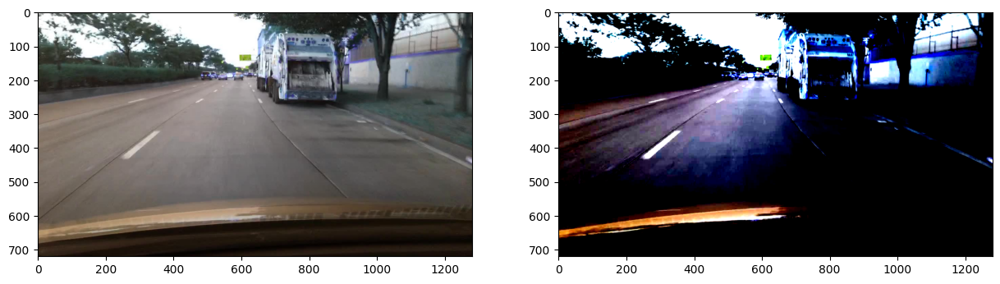

In [28]:
import matplotlib.pyplot as plt
transform = transforms.Compose([transforms.ToTensor()])
img = transform(image)


imgn = model.transform.normalize(img)
imgn = torch.permute(imgn, (1,2,0))
imgn= torch.clip(imgn, 0, 1)

fig, axes = plt.subplots(1,2, figsize=(15, 10))
axes[0].imshow(image)
axes[1].imshow(imgn)
plt.show()


In [7]:
# Define the class names given by PyTorch’s official Docs

coco_classes = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [8]:
model = model.to('cuda')
res = model([img.to('cuda')])

In [9]:
res[0].keys()

dict_keys(['boxes', 'labels', 'scores'])

In [10]:
print(res[0]['boxes'].shape)
print(res[0]['labels'].shape)
print(res[0]['scores'].shape)

torch.Size([33, 4])
torch.Size([33])
torch.Size([33])


In [11]:
res[0]['scores'][:15]

tensor([0.9837, 0.9610, 0.9583, 0.9106, 0.9047, 0.8789, 0.8763, 0.8533, 0.8366,
        0.7692, 0.7619, 0.5136, 0.3432, 0.3143, 0.3133], device='cuda:0',
       grad_fn=<SliceBackward0>)

In [12]:
res[0]['labels']

tensor([ 3,  3,  3,  3,  3,  6,  3,  3,  3,  6,  6,  3,  8,  3,  3,  3,  6,  3,
         8,  8,  3,  3,  3,  3,  1,  3,  8,  3,  8, 15,  3,  3, 67],
       device='cuda:0')

In [13]:
threshold = 0.5 #@param {type:"slider", min:0, max:1, step:0.1}

det_class = [coco_classes[i] for i in res[0]['labels'].detach().cpu().numpy()]
det_boxes = [i for i in res[0]['boxes'].detach().cpu().numpy()]
det_score = list(res[0]['scores'].detach().cpu().numpy())

det_indices = [det_score.index(x) for x in det_score if x > threshold]

det_boxes = [det_boxes[i] for i in det_indices]
det_classes = [det_class[i] for i in det_indices]
det_scores = [det_score[i] for i in det_indices]
print(len(det_boxes))

12


In [14]:
def inference(img, model, threshold=0.8, device='cuda'):

  transform = transforms.Compose([transforms.ToTensor()])
  img = transform(img).to(device)

  model = model.to(device)
  res = model([img])



  det_class = [coco_classes[i] for i in res[0]['labels'].detach().cpu().numpy()]
  det_boxes = [i for i in res[0]['boxes'].detach().cpu().numpy()]
  det_score = list(res[0]['scores'].detach().cpu().numpy())

  det_indices = [det_score.index(x) for x in det_score if x > threshold]

  det_boxes = [det_boxes[i] for i in det_indices]
  det_classes = [det_class[i] for i in det_indices]
  det_scores = [det_score[i] for i in det_indices]

  return det_boxes, det_class, det_score

def viz(img, model, threshold=0.5, rect_th=3, text_size=0.9, text_th=2, vid=False):

  if type(img) == str:
    image = cv2.imread(img)
    image= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  else:
    image=img
    vid=True

  boxes, det_cls, scores= inference(image, model, threshold)


  for i in range(len(boxes)):

    xmin = int(boxes[i][0])
    ymin = int(boxes[i][1])
    xmax = int(boxes[i][2])
    ymax = int(boxes[i][3])


    score_string = f'{det_cls[i]}: {(scores[i]*100):.2f}%'

    cv2.rectangle(image, (xmin, ymin), (xmax, ymax),color=(0, 255, 0), thickness=rect_th)

    (w, h), _ = cv2.getTextSize(
    score_string, cv2.FONT_HERSHEY_SIMPLEX, 0.9, text_th)

    cv2.rectangle(image, (xmin, ymin - 32), (xmin + w, ymin-4), (255,0,0), -1)
    cv2.putText(image,score_string, (xmin, ymin - 8),  cv2.FONT_HERSHEY_SIMPLEX, text_size, (255,255,255),thickness=text_th)
  if not vid:
    plt.figure(figsize=(10,25)) # display the output image
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.show()

  else:
    return img

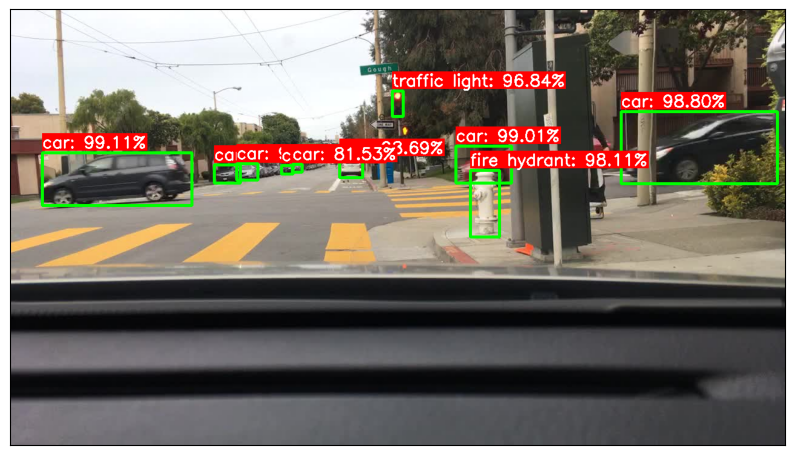

In [15]:
viz(images[3], model, threshold=0.8)

In [16]:
import cv2
from tqdm.notebook import tqdm


def video_detection(model, video, threshold = 0.8,
                    save_name= "output.mp4",
                    width = 1920,
                    height = 1080,
                    fps=30,
                    codec='mp4v'):

  output_size = (width, height)

  out = cv2.VideoWriter(save_name,cv2.VideoWriter_fourcc(*codec), fps , output_size)
  cap = cv2.VideoCapture(video)
  total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

  try:
    with tqdm(total=total) as pbar:
      while cap.isOpened():
          ret, img = cap.read()
          if not ret:
            print('done!')
            break
          img  = viz(img,model, threshold=threshold)
          out.write(cv2.resize(img, (width, height)))
          pbar.update(1)



      cap.release()
      out.release()

  except KeyboardInterrupt:
    cap.release()
    out.release()




In [17]:
!gdown --id 1F97YHjWTRNdVToFPT8Q60dGJwDFN0nZ_

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1F97YHjWTRNdVToFPT8Q60dGJwDFN0nZ_
To: /content/montreal-2.mp4
100% 26.4M/26.4M [00:00<00:00, 64.3MB/s]


In [18]:
##test2
video_detection(model, '/content/montreal-2.mp4')

  0%|          | 0/2141 [00:00<?, ?it/s]

done!


In [19]:
deps = True #@param{type: 'boolean'}

if deps:
  !pip install ffmpeg-python
  !pip install sox
  !sudo apt-get install -y gpac

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  gpac-modules-base liba52-0.7.4 libfaad2 libglu1-mesa libgpac11 libmad0
The following NEW packages will be installed:
  gpac gpac-modules-base liba52-0.7.4 libfaad2 libglu1-mesa libgpac11 libmad0
0 upgraded, 7 newly installed, 0 to remove and 24 not upgraded.
Need to get 4,800 kB of archives.
After this operation, 13.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 liba52-0.7.4 amd64 0.7.4-20 [30.5 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libfaad2 amd64 2.10.0-2 [197 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libglu1-mesa amd64 9.0.2-1 [145 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libmad0 amd64 0.15.1b-10ubuntu1 [63.1 kB]
Get:5 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libgpac11 amd64 2.0.0+dfsg1-2 [3,423 kB]


In [20]:
import base64
from IPython.display import HTML
import os
import ffmpeg
import glob2

def create_video(input = 'output.mp4',
               fps = 30,
               start=0,
               end=0,
               video_width = 640,
               video_height = 640):

  path = 'compressed.mp4'
  compressed_adjusted = f"compressed_{fps}fps.mp4"

  files = glob.glob('compressed*')
  for f in files:
    os.remove(f)

  print(f'Trimming and compressing {input}...')

  in_file = ffmpeg.input(input)
  if end > 0:
    in_file = in_file.trim(start=start, end=end)
  out = ffmpeg.output(in_file, path, vcodec='libx264', crf=28)
  ffmpeg.run(out)

  print(f'Adjusting to {fps} fps...')

  os.system(f'MP4Box -add {path} -raw 1 -new test')
  os.system(f'MP4Box -add test_track1.h264:fps={fps} -new {compressed_adjusted}')

  print('Done!')

  return compressed_adjusted


In [21]:
out = create_video(input='output.mp4', fps=30, end=10)

Trimming and compressing output.mp4...
Adjusting to 30 fps...
Done!


In [22]:
out

'compressed_30fps.mp4'

In [23]:
import base64
from IPython.display import HTML

video_width = 640
video_height = 640

# video = open(out, "r+b").read()
video = open("compressed.mp4", "r+b").read()
video_url = f"data:video/mp4;base64,{base64.b64encode(video).decode()}"
HTML(f"""<video height={video_height} width={video_width} controls><source src="{video_url}"></video>""")

# New Section